In [121]:
from PIL import Image
from io import BytesIO
from boto3 import client
import boto3
import time
import random
import json
import os
import pandas as pd
from image_process_tools import *
import requests as req
import numpy as np
import gist
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score

In [63]:
%load_ext autoreload

%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Specify s3 bucket name

In [64]:
bucket_name = "chen-gal-test"
s3 = boto3.client("s3")

In [65]:
prefix = "CVPR_indoor_imageset/images/"
s3 = boto3.resource('s3')
bucket = s3.Bucket(name=bucket_name)
FilesNotFound = True
folders = []
filenames = []
full_filenames = []
for obj in bucket.objects.filter(Prefix=prefix):
    string = obj.key.split('/')
    folders.append(string[-2])
    filenames.append(string[-1])
    full_filenames.append(obj.key)

df_dict = {'class':folders,'images':filenames,'full_filename':full_filenames}
image_df = pd.DataFrame(df_dict)

In [66]:
bucket_name = "chen-gal-test"
prefix = "CVPR_indoor_imageset/images/"
layers = 2

In [67]:
image_clean = image_df.drop(image_df[image_df['images']==''].index,axis=0)


## Show images for a certain category

In [7]:
image_class = 'florist'
datapath = 'https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/'+image_class+'/'

https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/Flower_shop_Kuala_Lumpur.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/MVC_107S.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/anais480.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/anaisflor480.jpg


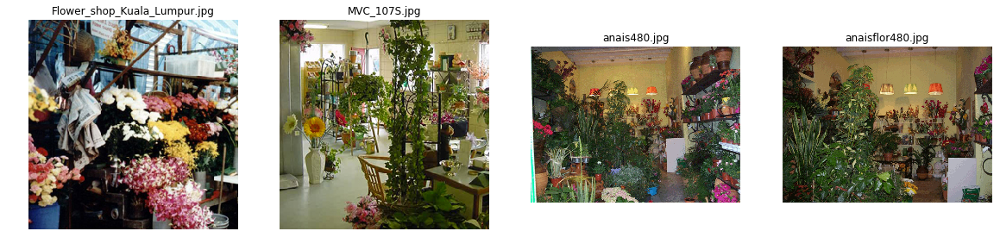

In [11]:
image_show(datapath,nums = 4,startImg = 10, imageList = image_clean[image_clean['class']==image_class]['images'].values,local = False)

## Extract features

In [6]:
classes = image_clean['class'].unique()

In [7]:
imgRootPath ='https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/'


In [ ]:
df_save_path = '../DataSet/features_indoor_cvpr.csv'


In [ ]:
dfs = []

In [21]:
# 
for i in range(0,len(classes)):
    print("Processing {}.........".format(classes[i]))
    imageList = image_clean[image_clean['class']==classes[i]]['images'].values
    imgFolder = imgRootPath + classes[i]+'/'
    print(imgFolder)
    # feature extraction
    features,imagenames =\
    gist_extraction(imgFolder,nums = len(imageList),startImg = 0,local = False, imageList =imageList)
    dfs.append(feature_df_assembly(features,imagenames,write_to_file = False, labels = classes[i]))

Processing buffet.........
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/
Processing 111 images
image 0 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/060926buffet_560.jpg
image 1 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/1092889351_618b8c3798_o.jpg
image 2 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/109484501_3d010b4367.jpg
image 3 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/114811570_481eefa09f.jpg
image 4 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/126829079_ec08a3996c.jpg
image 5 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/133_3369_IMG.jpg
image 6 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-te

image 58 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/P1011257_fs.jpg
image 59 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/P8311103.jpg
image 60 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/Sunday_Dinner.jpg
image 61 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/Wedding_Food_3_edited.jpg
image 62 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/african_village_bakau_12.jpg
image 63 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/buffet-food.jpg
image 64 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/buffet/buffet.jpg
image 65 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/image

image 11 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0012.jpg
image 12 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0013.jpg
image 13 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0014.jpg
image 14 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0015.jpg
image 15 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0016.jpg
image 16 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0017.jpg
image 17 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0018.jpg
image 18 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0

image 77 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0078.jpg
image 78 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0079.jpg
image 79 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0080.jpg
image 80 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0081.jpg
image 81 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0082.jpg
image 82 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0083.jpg
image 83 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0084.jpg
image 84 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0

image 142 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0143.jpg
image 143 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0144.jpg
image 144 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0145.jpg
image 145 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0146.jpg
image 146 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0147.jpg
image 147 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0148.jpg
image 148 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0149.jpg
image 149 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 207 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0208.jpg
image 208 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0209.jpg
image 209 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0210.jpg
image 210 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0211.jpg
image 211 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0212.jpg
image 212 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0213.jpg
image 213 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0214.jpg
image 214 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 272 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0273.jpg
image 273 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0274.jpg
image 274 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0275.jpg
image 275 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0276.jpg
image 276 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0277.jpg
image 277 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0278.jpg
image 278 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0279.jpg
image 279 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 337 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0338.jpg
image 338 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0339.jpg
image 339 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0340.jpg
image 340 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0341.jpg
image 341 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0342.jpg
image 342 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0343.jpg
image 343 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0344.jpg
image 344 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 402 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0403.jpg
image 403 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0404.jpg
image 404 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0405.jpg
image 405 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0406.jpg
image 406 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0407.jpg
image 407 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0408.jpg
image 408 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0409.jpg
image 409 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 467 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0468.jpg
image 468 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0469.jpg
image 469 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0470.jpg
image 470 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0471.jpg
image 471 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0472.jpg
image 472 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0473.jpg
image 473 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/casino_0474.jpg
image 474 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/casino/

image 14 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_04_02_3000_58_l.jpg
image 15 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_04_04_2000_78_l.jpg
image 16 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_04_05_6000_54_l.jpg
image 17 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_98_3_945_14_l.jpg
image 18 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_98_5_989_08_l.jpg
image 19 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_99_1_7838_12A_l.jpg
image 20 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/AT_99_1_7839_22_l.jpg
image 21 is in processing

image 73 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/indoor_playroom_27_.jpg
image 74 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/kids2_46_.jpg
image 75 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/kids_in_the_playroom_44_.jpg
image 76 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/kids_playroom_zurich_45_.jpg
image 77 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/opt_playroom_tepee_47_.jpg
image 78 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/our_house_043_48_.jpg
image 79 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/children_room/pippins_main_play_room_28_.jpg
image

image 19 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/4_9rieur_Le_Raincy_France_2007_interior.jpg
image 20 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/597086.jpg
image 21 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/806073.jpg
image 22 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/88012.jpg
image 23 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/A_museum_kirche_franken_20070515174824.jpg
image 24 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/Abbaye_Royale_de_Fontevraud_IMG_5387.jpg
image 25 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/CH_Horgen_RefKirche.j

image 77 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/blasii_kirche_nordhausen.jpg
image 78 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/brenac01_eglise02.jpg
image 79 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/buda_eglise_1.jpg
image 80 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/casa_kirche_56tz.jpg
image 81 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/chiemsee_fraueninsel_kircheP9175239_gross.jpg
image 82 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/church13.jpg
image 83 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/church15_1.jpg
image 84 is in pr

image 135 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_137_03_flickr.jpg
image 136 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_147_01_flickr.jpg
image 137 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_147_16_flickr.jpg
image 138 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_149_08_flickr.jpg
image 139 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_14_19_flickr.jpg
image 140 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/church_inside/metropolitana_151_07_flickr.jpg
image 141 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/imag

image 11 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/AULA3C_1TAMAOGRANDE.jpg
image 12 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/CEC_208_classroom.jpg
image 13 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/CLASSE3.jpg
image 14 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/Classroom.jpg
image 15 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/Classroom010_full.jpg
image 16 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/Classroom1.jpg
image 17 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/Classroom11.jpg
image 18 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indo

image 74 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/file_279474_23340.jpg
image 75 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/fouarre_classroom_02.jpg
image 76 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/fourmies_ecomusee2.jpg
image 77 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/groupe_scolaire_2.jpg
image 78 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/image17.jpg
image 79 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/img_0006.jpg
image 80 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/classroom/img_0007.jpg
image 81 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR

image 23 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro1.jpg
image 24 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro32.jpg
image 25 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro_Monasterio_San_Juan_de_los_Reyes.jpg
image 26 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro_Plasencia.jpg
image 27 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro_de_San_Isidoro_0.jpg
image 28 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro_de_San_Juan_de_los_Reyes.jpg
image 29 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/Claustro_de_San_Juan_de_los_Reyes_II.jpg
image 30 

image 84 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/claustropi7.jpg
image 85 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/claustroreyes.jpg
image 86 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/cloister1.jpg
image 87 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/cloister1ms.jpg
image 88 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/cloister22.jpg
image 89 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/cloister2_wc_gfdl.jpg
image 90 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cloister/cloister2s.jpg
image 91 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/imag

image 26 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Clothed_Closet_photo_300px_22Mar00.jpg
image 27 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Cognac_RI_Cropped_Shot.jpg
image 28 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Duluth_CherryX.jpg
image 29 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Haley_Custom_Closet_450.jpg
image 30 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/JLH_deluxemaplea.jpg
image 31 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Laminated_Clothing_Closet.jpg
image 32 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/Laminated_Clothing_Closet_1.jpg
image 33 is in processing
https://

image 90 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet6_lg.jpg
image 91 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet9713.jpg
image 92 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_02_450.jpg
image 93 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_05.jpg
image 94 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_1.jpg
image 95 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_2.jpg
image 96 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_4.jpg
image 97 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/closet/closet_6.jpg
image 

image 15 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/Bookstore88.jpg
image 16 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/Bookstore_5.jpg
image 17 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/Bookstore_Interior_rdax_90.jpg
image 18 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/Boutique_Takenoko.jpg
image 19 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/CIMG0506.jpg
image 20 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/CP67794.jpg
image 21 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/ClothingStore.jpg
image 22 is in processing
https://s3-us-west-2.amazon

image 76 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/fashionfix_drift21.jpg
image 77 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/fly_boutique.jpg
image 78 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/freeClothing.jpg
image 79 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/frenchconnection.jpg
image 80 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/home0001.jpg
image 81 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/images_bookstore_main1.jpg
image 82 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/clothingstore/img_3242_tokyo_harajuku_jingu_mae_meiji_dori_mise_fashion_cloth

image 29 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/Hemaraj_B_C_Computer_Room.jpg
image 30 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/IM000834.jpg
image 31 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/IM000835.jpg
image 32 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/IMG_0595.jpg
image 33 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/IMG_1144.jpg
image 34 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/Img_2495.jpg
image 35 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/Informatica4.jpg
image 36 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/C

image 89 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/electronica.jpg
image 90 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/fitxer75b_IMG_1581a.jpg
image 91 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/garantia.jpg
image 92 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/hank_comproom_lg.jpg
image 93 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/informatica.jpg
image 94 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/informatica2.jpg
image 95 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/computerroom/jpg_im17.jpg
image 96 is in processing
https://s3-us-west-2.amazonaws.com/chen-ga

image 33 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/Meng_Concert_Hall_.jpg
image 34 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/Music_Concert_Hall_2.jpg
image 35 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/Music_Concert_Hall_3.jpg
image 36 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/NorwoodConcertHall_copy.jpg
image 37 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/OnondagaCivicCenter.jpg
image 38 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/Overture_Hall_1.jpg
image 39 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/PAC_interior.jpg
image 40 is in processing


image 94 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/slide7.jpg
image 95 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/slleconcert.jpg
image 96 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/sydney_opera_house_concert_hall.jpg
image 97 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/theater.jpg
image 98 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/url.jpg
image 99 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/ven_chall_big.jpg
image 100 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/concert_hall/vhstage.jpg
image 101 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-tes

image 51 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/Entry_Corridor.jpg
image 52 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/FW_97_6_2287_15_l.jpg
image 53 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/F_Corridor_and_Lving_Room.jpg
image 54 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/Hotel_Corridor_2.jpg
image 55 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/Hotel_Panama_Corridor_to_the_Pool_Amador.jpg
image 56 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/Hotel_aloj_pasillo_1_1024.jpg
image 57 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/IMGP3211.jpg
image 58 is in processing
https://s3

image 114 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/building_one_top_corridor.jpg
image 115 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c1.jpg
image 116 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c10.jpg
image 117 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c11.jpg
image 118 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c12.jpg
image 119 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c13.jpg
image 120 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c14.jpg
image 121 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/c15.jpg
image 122 i

image 179 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora2.jpg
image 180 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora3.jpg
image 181 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora4.jpg
image 182 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora5.jpg
image 183 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora6.jpg
image 184 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora7.jpg
image 185 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/corridora8.jpg
image 186 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/

image 242 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/korridor.jpg
image 243 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/korridor2.jpg
image 244 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/korridor3.jpg
image 245 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/large_tour.jpg
image 246 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/link_corridor.jpg
image 247 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/lobby48.jpg
image 248 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/londres_023.jpg
image 249 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/cor

image 307 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_1_c.jpg
image 308 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_2.jpg
image 309 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_bajo_c.jpg
image 310 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_edificio_escuela__480x640_c.jpg
image 311 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_frente_a_las.jpg
image 312 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_interior_1_t.jpg
image 313 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/corridor/pasillo_lorca.jpg
image 314 is in processing
https://s3-us-west-2.amaz

image 23 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_05_17_yahoo.jpg
image 24 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_05_18_yahoo.jpg
image 25 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_05_20_altavista.jpg
image 26 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_06_01_altavista.jpg
image 27 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_06_01_yahoo.jpg
image 28 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_06_11_altavista.jpg
image 29 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_06_15_yahoo.jpg
image 30 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoo

image 86 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_129_01_flickr.jpg
image 87 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_129_09_flickr.jpg
image 88 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_129_10_flickr.jpg
image 89 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_129_23_flickr.jpg
image 90 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_12_02_yahoo.jpg
image 91 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_12_14_yahoo.jpg
image 92 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_131_13_flickr.jpg
image 93 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_

image 149 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_28_07_altavista.jpg
image 150 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_28_10_altavista.jpg
image 151 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_28_12_flickr.jpg
image 152 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_28_22_flickr.jpg
image 153 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_30_06_altavista.jpg
image 154 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_30_07_altavista.jpg
image 155 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_30_16_altavista.jpg
image 156 is in processing
https://s3-us-west-2.amazonaws.com/chen-g

image 211 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_81_07_flickr.jpg
image 212 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_81_10_flickr.jpg
image 213 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_81_15_flickr.jpg
image 214 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_81_23_flickr.jpg
image 215 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_82_08_flickr.jpg
image 216 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_83_12_flickr.jpg
image 217 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/deli/deli_84_07_flickr.jpg
image 218 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_in

image 13 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_01_22_flickr.jpg
image 14 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_03_19_altavista.jpg
image 15 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_10_03_altavista.jpg
image 16 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_11_02_flickr.jpg
image 17 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_11_13_flickr.jpg
image 18 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_12_09_flickr.jpg
image 19 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentaire_13_14_altavista.j

image 70 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_108_10_flickr.jpg
image 71 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_109_05_flickr.jpg
image 72 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_109_09_flickr.jpg
image 73 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_112_04_flickr.jpg
image 74 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_114_20_flickr.jpg
image 75 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_116_05_flickr.jpg
image 76 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/dentista_117_06_flickr.jpg

image 129 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/office4.jpg
image 130 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dentaloffice/tworivers23.jpg
Processing dining_room.........
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/
Processing 274 images
image 0 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/00036_NiagaraFalls4.jpg
image 1 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/1474255jhe7.jpg
image 2 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/17mdin.jpg
image 3 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/2dining_room.jpg
image 4 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-t

image 60 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d16.jpg
image 61 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d2.jpg
image 62 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d3.jpg
image 63 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d4.jpg
image 64 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d5.jpg
image 65 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d6.jpg
image 66 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d7.jpg
image 67 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/d8.jpg
image 68 is in processi

image 124 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining16.jpg
image 125 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining2.jpg
image 126 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining22.jpg
image 127 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining26.jpg
image 128 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining29.jpg
image 129 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining3.jpg
image 130 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/dining31.jpg
image 131 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/im

image 188 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int294.jpg
image 189 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int3.jpg
image 190 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int31.jpg
image 191 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int32.jpg
image 192 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int369.jpg
image 193 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int371.jpg
image 194 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/int468.jpg
image 195 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room

image 251 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger5.jpg
image 252 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger56.jpg
image 253 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger_1.jpg
image 254 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger_bas_.jpg
image 255 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger_jordane_big.jpg
image 256 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger_k.jpg
image 257 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/dining_room/salle_a_manger_rez_1.jpg
image 258 is in processin

image 34 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00332.jpg
image 35 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00471.jpg
image 36 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00472.jpg
image 37 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00476.jpg
image 38 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00477.jpg
image 39 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC00478.jpg
image 40 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/DSC06236.jpg
image 41 is in processing
https://s3-us-west-2.a

image 92 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/hut4.jpg
image 93 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/mcdonalds.jpg
image 94 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/melvados_gif.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/melvados_gif.jpg is error
image 95 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/p374062_Fajardo_El_Pollo_Tropical.jpg
image 96 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/panther_grill_gif.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/fastfood_restaurant/panther_grill_gif.jpg is error
image 97 is in processing
https://

image 33 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_05_17_flickr.jpg
image 34 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_07_08_flickr.jpg
image 35 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_08_08_flickr.jpg
image 36 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_08_16_flickr.jpg
image 37 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_08_21_flickr.jpg
image 38 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_09_04_flickr.jpg
image 39 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/floreria_09_24_flickr.jpg
image 40 is in processing
https://s3-us-w

image 94 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/ildo_encabo_150206_c_ok.jpg
image 95 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/image002.jpg
image 96 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/p1_1.jpg
image 97 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/r0.jpg
image 98 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/rt_wall.jpg
image 99 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/scai_fev_07_9.jpg
image 100 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/star_florist.jpg
image 101 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/florist/tienda

image 52 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/P6170172.jpg
image 53 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/PO_06_03_3000_49_l.jpg
image 54 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/SD_00_06_51275_24_l.jpg
image 55 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/SalleDeJeux.jpg
image 56 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/Salle_Jeux_58936.jpg
image 57 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/Salle_de_Jeux_Villa_3_1_.jpg
image 58 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/Salle_expositions_jeux_d_echecs_02.jpg
image 59 is in processing
https://s3-us-west-2.amaz

image 112 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_02_02_altavista.jpg
image 113 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_03_12_altavista.jpg
image 114 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_05_19_altavista.jpg
image 115 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_07_14_altavista.jpg
image 116 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_07_19_altavista.jpg
image 117 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle_de_jeux_08_09_altavista.jpg
image 118 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/gameroom/salle

image 46 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/UltiPro.jpg
image 47 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/XF_HOMES_400.jpg
image 48 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/a8afd7d2.jpg
image 49 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/aug_outside04.jpg
image 50 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/basement_4.jpg
image 51 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/basement_garage.jpg
image 52 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/bens_garage.jpg
image 53 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/garage/dbl_garag

image 4 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/1412_mb_file_0a8c5_gif.jpg
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/1412_mb_file_0a8c5_gif.jpg is error
image 5 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/20070417klpcnatun_229_Ies_SCO.jpg
image 6 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/20070418klpcnaecl_364_Ies_SCO.jpg
image 7 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/2026_2006_Grimm_s_Gardens_Greenhouse.jpg
image 8 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/2_wallington_greenhouse_470x353.jpg
image 9 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/47_Invernadero_1.jpg
image

image 65 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhousegh1.jpg
image 66 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhouseikjj2.jpg
image 67 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhouselk2.jpg
image 68 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhouseoi1.jpg
image 69 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhousetr_2.jpg
image 70 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/greenhousey_2.jpg
image 71 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/greenhouse/hortela_nas_estufas_2.jpg
image 72 is in processing
https://s3-us-west-2.amazonaws.com/chen

image 24 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/2531197179_57d0f6ffec.jpg
image 25 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/257_c1000.jpg
image 26 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/2fgr_supermarkt.jpg
image 27 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/301657659_e825749871.jpg
image 28 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/318111272_14218344c8.jpg
image 29 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/380416_12c9679a1_l.jpg
image 30 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/400_F_2072702_0czrOPPRxph5STUVfX3QxpCrEk80sG.jpg
image 

image 83 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Storeisle_png.jpg
image 84 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Supermarkt.jpg
image 85 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Supermarkt6_1216096090.jpg
image 86 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Supermarkt_DSC01732_m.jpg
image 87 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Supermercado.jpg
image 88 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/Supermercado1.jpg
image 89 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/WEB2.jpg
image 90 is in processing
https://s3-us-west-2.amazonaws.c

image 143 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/intDSCF0784_PhotoRedukto.jpg
image 144 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/integral_color4_detail.jpg
image 145 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/japanese_food_fruit_stand.jpg
image 146 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/kasten_supermarkt_brouwers2_spar.jpg
image 147 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/kays_1.jpg
image 148 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/keilsinside_1.jpg
image 149 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/large_1.jpg
image 150 is in p

image 205 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/ucsi009266.jpg
image 206 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/url.jpg
image 207 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/url_1.jpg
image 208 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/veg_isle1.jpg
image 209 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/wholefoods2.jpg
image 210 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/z_8db52c8a2946ce611ea858e31792692d.jpg
image 211 is in processing
https://s3-us-west-2.amazonaws.com/chen-gal-test/CVPR_indoor_imageset/images/grocerystore/zeman_pic_supermarket.jpg
image 212 is in processing
https://s3-us-west-2.amazo

In [ ]:
combined_dfs.to_csv('../DataSet/features_indoor_cvpr.csv')

## Similarity comparision_sample visualization

In [14]:
X_sim_florist = cosine_similarity(feature_florist)

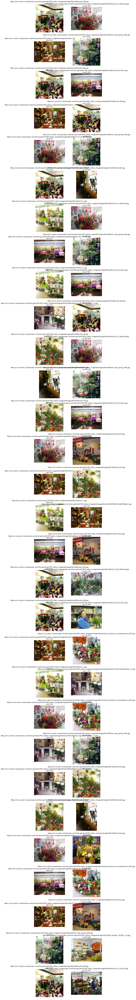

In [17]:
show_similar_images(X_sim_florist,0.7,imagename_florist,limit = 30,local = False,reverse = True)

In [10]:
def feature_df_assembly(X,imgNameList,write_to_file = False, **kwargs):
    '''
        Function: assemble features and meta info into a dataframe and write to .csv file\
        Input:
            X:<array> feature matrix
            imgNameList:<list> name of the original images
            write_to_file:<bool> if true, the dataframe will be save to a csv file in the current work directory
            class_labels:<list> if known
        Output:
            dataframe
    '''
    if len(X) != len(imgNameList):
        raise Exception('imgNameList should have the same length as features')
    
    dict_tmp = {'features':X.tolist(),'img_names':imgNameList}
    df_return = pd.DataFrame(dict_tmp)
    
    if 'labels' in kwargs:
        labels = kwargs['labels']
        df_return['class_label'] = labels
    
    if write_to_file:
        df_return.to_csv(write_to_file)
    return df_return

In [11]:
df_features = feature_df_assembly(feature_florist,imagename_florist,write_to_file = 'features_for_florist.csv', labels = 'florist')

## Similarity validation

#### Load in data

In [149]:
df_features = pd.read_csv('../DataSet/features_indoor_cvpr.csv')

In [150]:
df_features.head()

,Unnamed: 0,features,img_names,class_label,category
0,0,"[0.2324916124343872, 0.2341548055410385, 0.229...",https://s3-us-west-2.amazonaws.com/chen-gal-te...,airport_inside,['airport_inside']
1,1,"[0.3178395628929138, 0.3173072040081024, 0.319...",https://s3-us-west-2.amazonaws.com/chen-gal-te...,airport_inside,['airport_inside']
2,2,"[0.2516123354434967, 0.31590282917022705, 0.32...",https://s3-us-west-2.amazonaws.com/chen-gal-te...,airport_inside,['airport_inside']
3,3,"[0.16501374542713165, 0.17000266909599304, 0.1...",https://s3-us-west-2.amazonaws.com/chen-gal-te...,airport_inside,['airport_inside']
4,4,"[0.026718752458691597, 0.0811905562877655, 0.0...",https://s3-us-west-2.amazonaws.com/chen-gal-te...,airport_inside,['airport_inside']


sklearn.metrics.pairwise.pairwise_distances(X, Y=None, metric=’cosine’, n_jobs=1)
sklearn.metrics.silhouette_score(X, labels, metric=’euclidean’, sample_size=None

In [145]:
df_features_clean_2= df_features_clean_1[1]

In [146]:
df_features_clean_2 = np.concatenate((df_features_clean_2.reshape(1,-1),df_features_clean_1[2].reshape(1,-1)),axis=0)

In [147]:
df_features_clean_2.shape

(2, 960)

In [137]:
df_features_clean_2

array([[0.31783956],
       [0.3173072 ],
       [0.31927106],
       ...,
       [0.03240393],
       [0.03290917],
       [0.03262222]])

In [124]:
def clean_string_to_array(string):
    cleaned_list = []
    splited_string = string.split(',')
    cleaned_list = [x.strip('[') for x in splited_string]
    cleaned_list = [x.strip(']') for x in cleaned_list]
    return np.array([float(x) for x in cleaned_list])
    

In [158]:
def get_feature_matrix_from_DF(df):
    df_clean = df['features'].apply(lambda x:clean_string_to_array(x))
    return_matrix = df_clean[1].reshape(1,-1)
    for i in range(1,len(df_clean)):
        return_matrix = np.concatenate((return_matrix,df_clean[i].reshape(1,-1)),axis = 0)
    return return_matrix
    

In [159]:
x = get_feature_matrix_from_DF(df_features)

In [165]:
y = df_features.class_label.values
len(y)

5481

In [166]:
sil_dis = silhouette_score(x,y,metric='cosine')

In [167]:
sil_dis

-0.22971392385790096

In [168]:

from sklearn.metrics.pairwise import distance_metrics

from sklearn.metrics.pairwise import pairwise_distances

In [174]:
metric = distance_metrics()['cosine']

In [170]:
metric

<function sklearn.metrics.pairwise.cosine_distances>

In [177]:
p = np.array([[0,1],[1,0]])

In [178]:
p1 = metric(p[0,:],p[1,:])

ValueError: Expected 2D array, got 1D array instead:
array=[0. 1.].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [176]:
p1

array([[0., 1.],
       [1., 0.]])